In [1]:
using CSV
using DataFrames
using FFTW
using Plots
using DelimitedFiles
using LinearAlgebra

In [2]:
function coordinates_to_angle(x1,y1,x2,y2)
    return atan(y2-y1,x2-x1)
end

coordinates_to_angle (generic function with 1 method)

In [3]:
coordinates_to_angle(0,0,1,-1)

-0.7853981633974483

In [4]:
# Define the grid dimensions and ranges
n = 400  # number of points along each axis
x_range = range(-40, 40, length=n)
y_range = range(-40, 40, length=n)

lambdaF = 1;
p_F = 2*pi/lambdaF;

## The two impurities are at (a,0) and (-a,0)
a = 5*lambdaF;
r12 = 2*a;

In [5]:
custom_cmap = cgrad([:blue, :white, :orange], [0.4, 0.6])

In [6]:
function phi(r)
    return p_F*r - pi/4
end

phi (generic function with 1 method)

In [7]:
# Initialize the data container
results_2nd_order = DataFrame(x=Float64[], y=Float64[], value=Float64[])
results_2nd_order_hyperbola = DataFrame(x=Float64[], y=Float64[], value=Float64[])
results_1st_order = DataFrame(x=Float64[], y=Float64[], value=Float64[])
results_1st_order_one_impurity = DataFrame(x=Float64[], y=Float64[], value=Float64[])

Delta = 1;
omega0 = 1.1*Delta;

vF=1000;
theta12 = 0;


In [8]:
sigma_x = [0 1; 1 0]
sigma_y = [0 -im; im 0]
sigma_z = [1 0; 0 -1]
sigma_plus = [0 1; 0 0]
sigma_minus = [0 0; 1 0];
sigma_zero = [1 0; 0 1];
sigma_prefactor = (sigma_zero + sigma_z)/2;

In [9]:
function Green_function(x1,x2,y1,y2, omega)
    dist = sqrt((x1-x2)^2 + (y1-y2)^2)

    g_plus = exp(im*phi(dist)) * exp(im*sqrt(omega^2 - Delta^2)*dist/vF) * ((im*omega/sqrt(omega^2 - Delta^2))*sigma_zero + im*sigma_z + ((sigma_plus)*im*Delta*exp(2*im*coordinates_to_angle(x1,y1,x2,y2)) + (sigma_minus)*im*Delta*exp(-2*im*coordinates_to_angle(x1,y1,x2,y2)))/sqrt(omega^2 - Delta^2))
    g_minus = exp(-im*phi(dist)) * exp(im*sqrt(omega^2 - Delta^2)*dist/vF) * ((im*omega/sqrt(omega^2 - Delta^2))*sigma_zero - im*sigma_z + ((sigma_plus)*im*Delta*exp(2*im*coordinates_to_angle(x1,y1,x2,y2)) + (sigma_minus)*im*Delta*exp(-2*im*coordinates_to_angle(x1,y1,x2,y2)))/sqrt(omega^2 - Delta^2))

    return g_plus/sqrt(sqrt(dist^2+lambdaF^2)), g_minus/sqrt(sqrt(dist^2+lambdaF^2))
end

Green_function (generic function with 1 method)

In [10]:
G12_plus, G12_minus = Green_function(a,-a,0,0,omega0)
G12 = G12_plus + G12_minus

2×2 Matrix{ComplexF64}:
    0.441191+1.07286im   -0.00446101+0.973465im
 -0.00446101+0.973465im    -0.451005+1.06877im

In [11]:
for x in x_range, y in y_range

    G23_plus, G23_minus = Green_function(x,a,y,0,omega0)
    G31_plus, G31_minus = Green_function(x,-a,y,0,omega0)

    G23 = G23_plus + G23_minus
    G31 = G31_plus + G31_minus

    value = 0.01*(-1/(pi)) * imag(tr(sigma_prefactor*(G23*sigma_z*G12*sigma_z*G31 + G31*sigma_z*G12*sigma_z*G23)))
    value_hyp = 0.01*(-1/(pi)) * imag(tr(sigma_prefactor*(G23_plus*sigma_z*G12*sigma_z*G31_minus + G31_plus*sigma_z*G12*sigma_z*G23_minus + G23_minus*sigma_z*G12*sigma_z*G31_plus + G31_minus*sigma_z*G12*sigma_z*G23_plus)))

    value_1st_order = (-1/(pi)) * imag(tr(sigma_prefactor*(G23*sigma_z*G23 + G31*sigma_z*G31)))

    push!(results_2nd_order, (x, y, value))
    push!(results_2nd_order_hyperbola, (x, y, value_hyp))
    push!(results_1st_order, (x, y, value_1st_order))
end

# # Save the results to a CSV file
# CSV.write("d+id_2nd_order.csv", results_2nd_order, writeheader=false)
# CSV.write("d+id_2nd_order_hyperbola.csv", results_2nd_order_hyperbola, writeheader=false)
# CSV.write("d+id_1st_order.csv", results_1st_order, writeheader=false)

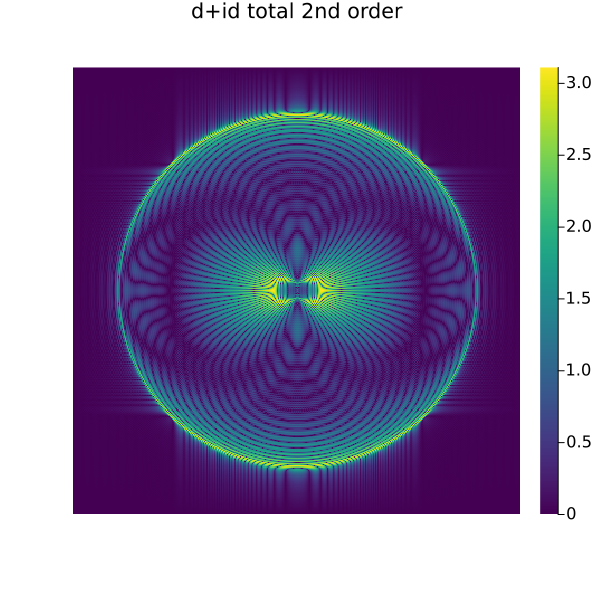

In [33]:
# Extract columns
x = results_2nd_order.x
y = results_2nd_order.y
data_2nd_order = results_2nd_order.value

# Get unique x and y values
unique_x = unique(x)
unique_y = unique(y)

# Reshape data into a 2D array
data_2nd_order_reshaped = reshape(data_2nd_order, length(unique_y), length(unique_x))

# Step 2: Perform 2D Fourier Transform
ft_data = fft(data_2nd_order_reshaped)
ft_data_shifted = fftshift(ft_data)

# Compute magnitude and log scale for better visualization
ft_magnitude = abs.(ft_data_shifted)
ft_magnitude_log = log1p.(ft_magnitude)  # log(1 + magnitude) for stability

# Step 3: Plot the Fourier Transform
p_hyp_fourier = heatmap(
    unique_x, unique_y, ft_magnitude_log,
    color=:viridis, aspect_ratio=:equal,
    xlabel="kx", ylabel="ky",
    title="d+id total 2nd order",
    framestyle=:none, size=(600, 600)
)

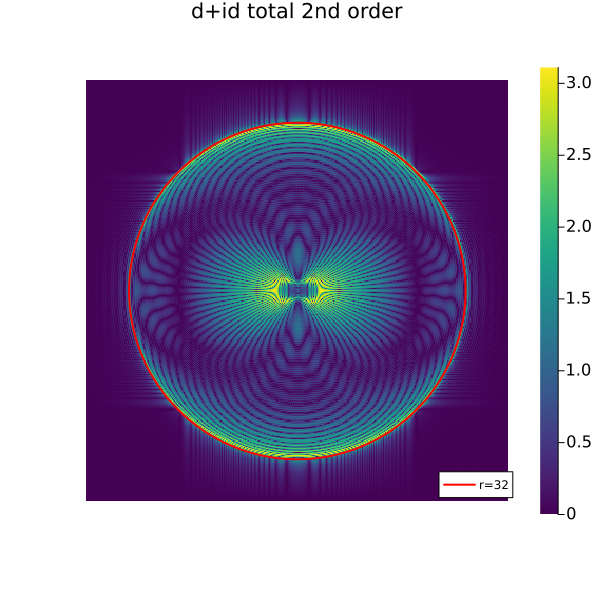

In [34]:
# Overlay a ring at radius = 80
θ = range(0, 2π, length=500)
ring_radius = 32
p_hyp_fourier=plot!(
    ring_radius * cos.(θ),
    ring_radius * sin.(θ),
    color=:red, linewidth=2, label="r=32"
)

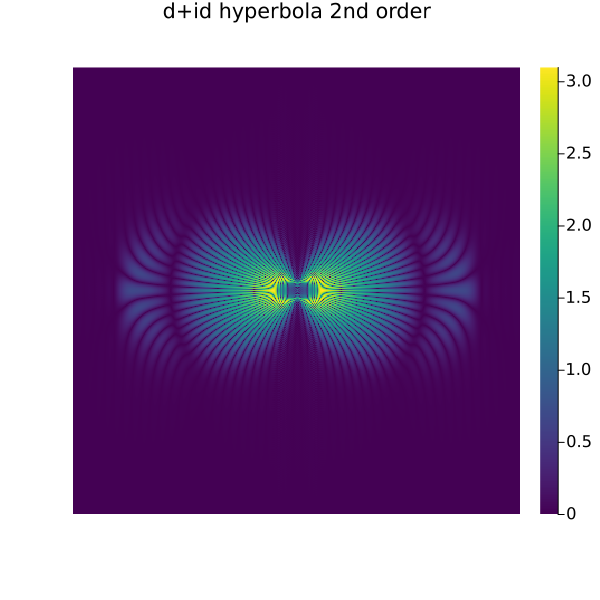

In [14]:
# Extract columns
x = results_2nd_order_hyperbola.x
y = results_2nd_order_hyperbola.y
data_hyperbola = results_2nd_order_hyperbola.value

# Get unique x and y values
unique_x = unique(x)
unique_y = unique(y)

# Reshape data into a 2D array
data_2nd_order_hyperbola_reshaped = reshape(data_hyperbola, length(unique_y), length(unique_x))

# Step 2: Perform 2D Fourier Transform
ft_data_hyperbola = fft(data_2nd_order_hyperbola_reshaped)
ft_data_shifted_hyperbola = fftshift(ft_data_hyperbola)

# Compute magnitude and log scale for better visualization
ft_magnitude_hyperbola = abs.(ft_data_shifted_hyperbola)
ft_magnitude_log_hyperbola = log1p.(ft_magnitude_hyperbola)  # log(1 + magnitude) for stability

# Step 3: Plot the Fourier Transform
heatmap(
    unique_x, unique_y, ft_magnitude_log_hyperbola,
    color=:viridis, aspect_ratio=:equal,
    xlabel="kx", ylabel="ky",
    title="d+id hyperbola 2nd order",
    framestyle=:none, size=(600, 600)
)

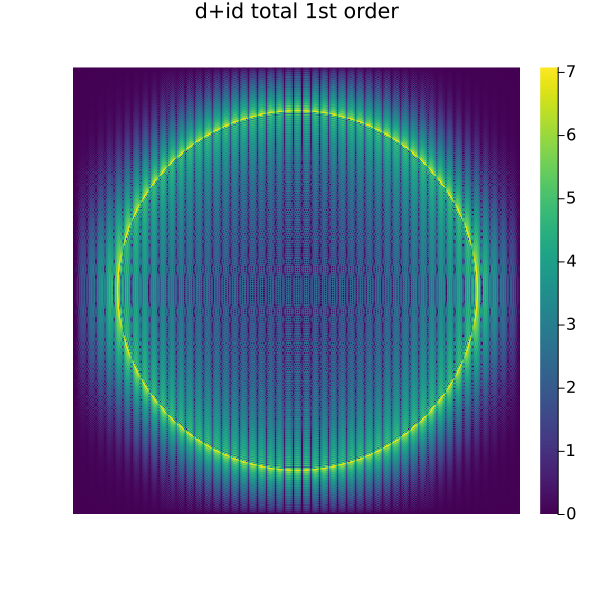

In [15]:
# Extract columns
x = results_1st_order.x
y = results_1st_order.y
data_1st_order = results_1st_order.value

# Get unique x and y values
unique_x = unique(x)
unique_y = unique(y)

# Reshape data into a 2D array
data_1st_order_reshaped = reshape(data_1st_order, length(unique_y), length(unique_x))

# Step 2: Perform 2D Fourier Transform
ft_data_1st_order = fft(data_1st_order_reshaped)
ft_data_shifted_1st_order = fftshift(ft_data_1st_order)

# Compute magnitude and log scale for better visualization
ft_magnitude_1st_order = abs.(ft_data_shifted_1st_order)
ft_magnitude_log_1st_order = log1p.(ft_magnitude_1st_order)  # log(1 + magnitude) for stability

# Step 3: Plot the Fourier Transform
heatmap(
    unique_x, unique_y, ft_magnitude_log_1st_order,
    color=:viridis, aspect_ratio=:equal,
    xlabel="kx", ylabel="ky",
    title="d+id total 1st order",
    framestyle=:none, size=(600, 600)
)

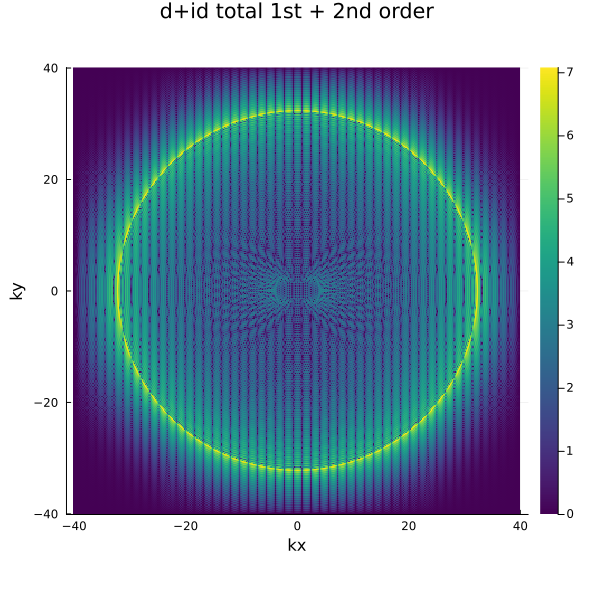

In [16]:
# Step 2: Perform 2D Fourier Transform
ft_data_total = fft(data_1st_order_reshaped+data_2nd_order_reshaped)
ft_data_shifted_total = fftshift(ft_data_total)

# Compute magnitude and log scale for better visualization
ft_magnitude_total = abs.(ft_data_shifted_total)
ft_magnitude_log_total = log1p.(ft_magnitude_total)  # log(1 + magnitude) for stability

# Step 3: Plot the Fourier Transform
heatmap(
    unique_x, unique_y, ft_magnitude_log_total,
    color=:viridis, aspect_ratio=:equal,
    xlabel="kx", ylabel="ky",
    title="d+id total 1st + 2nd order",
    # framestyle=:none, 
    size=(600, 600)
)

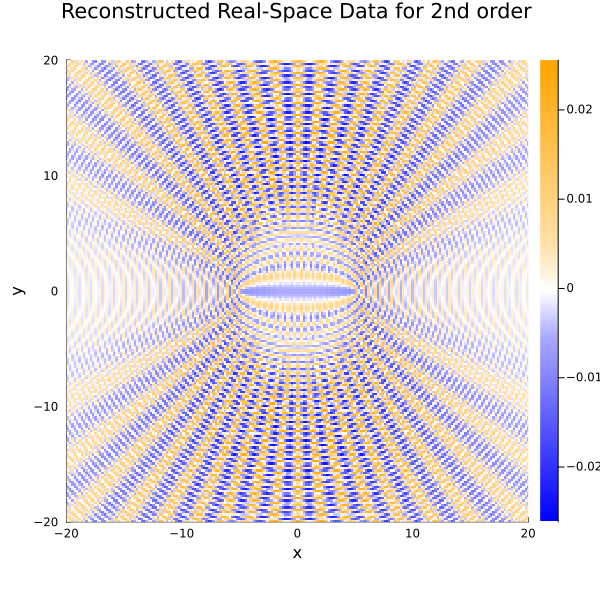

In [17]:
# Assuming `ft_data` is the Fourier transformed data from the previous step
# Step 1: Perform the Inverse Fourier Transform
data_reconstructed = ifft(ft_data)

# Convert to real values (discard negligible imaginary parts)
data_real = real(data_reconstructed)

custom_cmap = cgrad([:blue, :white, :orange], [0.4, 0.6])  # Adjusting blend points

# Step 2: Plot the reconstructed data in real space
heatmap(
    unique_x, unique_y, data_real,
    color=custom_cmap, aspect_ratio=:equal,
    xlim=(-20, 20), ylim=(-20, 20),
    xlabel="x", ylabel="y",
    title="Reconstructed Real-Space Data for 2nd order",
    size=(600, 600)
)

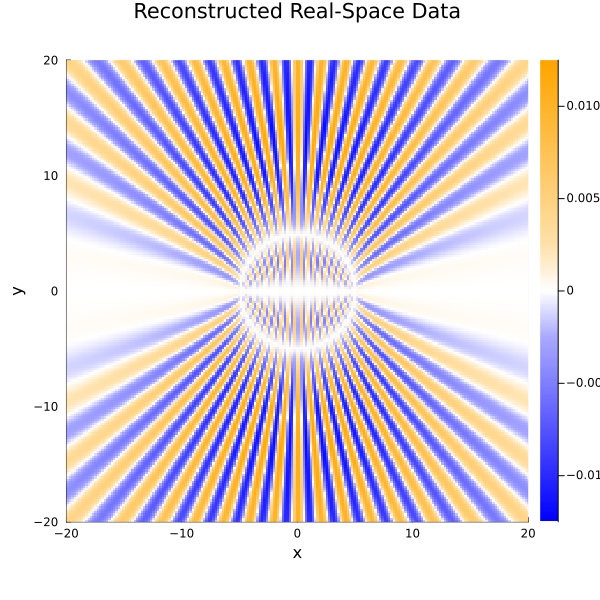

In [18]:
# Assuming `ft_data` is the Fourier transformed data from the previous step
# Step 1: Perform the Inverse Fourier Transform
data_reconstructed_hyperbola = ifft(ft_data_hyperbola)

# Convert to real values (discard negligible imaginary parts)
data_real_hyperbola = real(data_reconstructed_hyperbola)

custom_cmap = cgrad([:blue, :white, :orange], [0.4, 0.6])  # Adjusting blend points

# Step 2: Plot the reconstructed data in real space
heatmap(
    unique_x, unique_y, data_real_hyperbola,
    color=custom_cmap, aspect_ratio=:equal,
    xlim=(-20, 20), ylim=(-20, 20),
    clim=(-0.01*1.25,0.01*1.25),
    xlabel="x", ylabel="y",
    title="Reconstructed Real-Space Data",
    size=(600, 600)
)

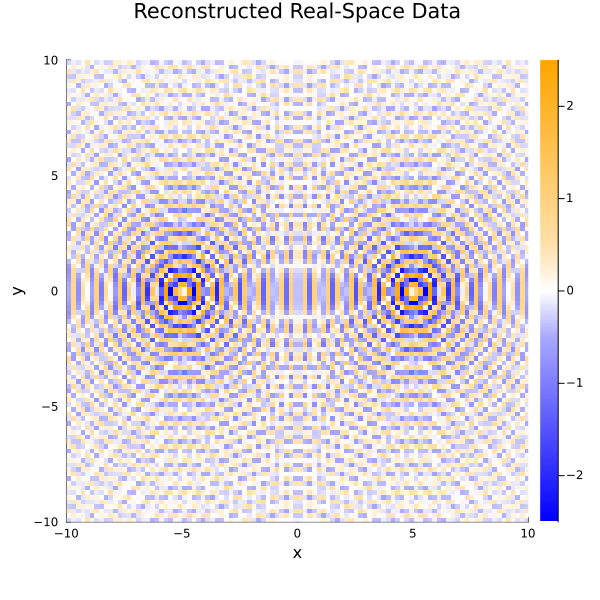

In [19]:
# Assuming `ft_data` is the Fourier transformed data from the previous step
# Step 1: Perform the Inverse Fourier Transform
data_reconstructed_1st_order = ifft(ft_data_1st_order)

# Convert to real values (discard negligible imaginary parts)
data_real_1st_order = real(data_reconstructed_1st_order)

custom_cmap = cgrad([:blue, :white, :orange], [0.4, 0.6])  # Adjusting blend points

# Step 2: Plot the reconstructed data in real space
heatmap(
    unique_x, unique_y, data_real_1st_order,
    color=custom_cmap, aspect_ratio=:equal,
    xlim=(-10, 10), ylim=(-10, 10),
    clim=(-2.50,2.50),
    xlabel="x", ylabel="y",
    title="Reconstructed Real-Space Data",
    size=(600, 600)
)

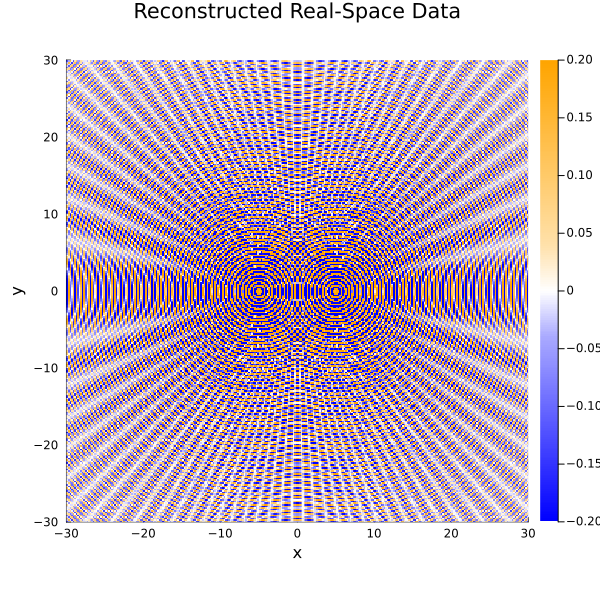

In [20]:
# Assuming `ft_data` is the Fourier transformed data from the previous step
# Step 1: Perform the Inverse Fourier Transform
data_reconstructed_1st_order = ifft(ft_data_1st_order)

# Convert to real values (discard negligible imaginary parts)
data_real_1st_order = real(data_reconstructed_1st_order)

custom_cmap = cgrad([:blue, :white, :orange], [0.4, 0.6])  # Adjusting blend points

# Step 2: Plot the reconstructed data in real space
heatmap(
    unique_x, unique_y, data_real_1st_order,
    color=custom_cmap, aspect_ratio=:equal,
    xlim=(-30, 30), ylim=(-30, 30),
    clim=(-0.20,0.20),
    xlabel="x", ylabel="y",
    title="Reconstructed Real-Space Data",
    size=(600, 600)
)

In [21]:
maximum(data_real_hyperbola)

0.011930611373748568

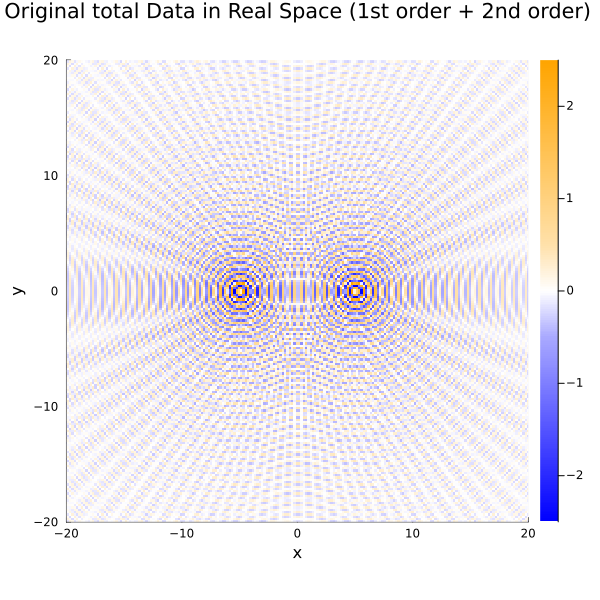

In [22]:
heatmap(
    unique_x, unique_y, data_2nd_order_reshaped + data_1st_order_reshaped,
    color=custom_cmap, aspect_ratio=:equal,
    xlim=(-20, 20), ylim=(-20, 20),
    clim=(-2.50,2.50),
    xlabel="x", ylabel="y",
    title="Original total Data in Real Space (1st order + 2nd order)",
    size=(600, 600)
)

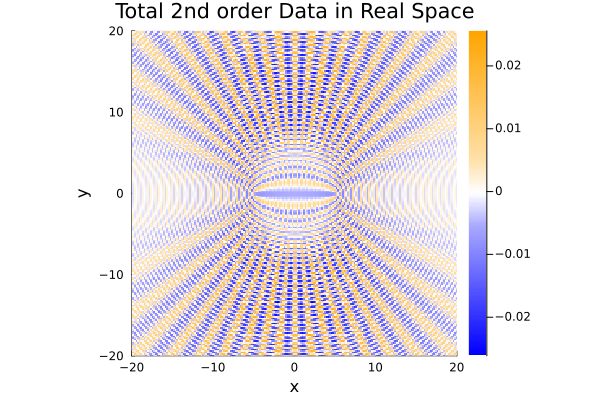

In [23]:
heatmap(
    unique_x, unique_y, data_2nd_order_reshaped,
    color=custom_cmap, aspect_ratio=:equal,
    xlim=(-20, 20), ylim=(-20, 20),
    xlabel="x", ylabel="y",
    title="Total 2nd order Data in Real Space"
)

In [24]:
ft_data_shifted_total

400×400 Matrix{ComplexF64}:
  5.70377e-15+0.0im          …  -3.34088e-15+5.74744e-15im
 -1.07137e-14+1.14492e-14im       1.57932e-5+6.30052e-15im
  7.34829e-15-2.83107e-15im       -9.0164e-5-7.08161e-7im
  1.55431e-15+1.38778e-15im       4.72837e-5+7.42792e-7im
 -7.16788e-15-7.77156e-15im     -0.000180331-4.24975e-6im
  7.74381e-15+1.44329e-14im  …    7.84759e-5+2.46621e-6im
  7.91034e-16+1.33227e-15im     -0.000270485-1.06274e-5im
 -4.84335e-15-1.55431e-15im      0.000109164+5.14803e-6im
 -7.36911e-15+1.84297e-14im     -0.000360608-1.98455e-5im
  4.56579e-15+2.44249e-15im      0.000139138+8.75382e-6im
             ⋮               ⋱  
 -1.55431e-15-1.77636e-15im     -0.000138983+1.09382e-5im
 -1.23512e-15-5.32907e-15im      0.000360252-2.55072e-5im
 -4.04538e-15+6.77236e-15im     -0.000109069+6.86206e-6im
  6.92502e-15+1.55431e-15im      0.000270284-1.48746e-5im
  4.96131e-15-5.93969e-15im  …   -7.84275e-5+3.69855e-6im
 -9.59996e-15+8.10463e-15im      0.000180242-7.08175e-6im
  4.08701

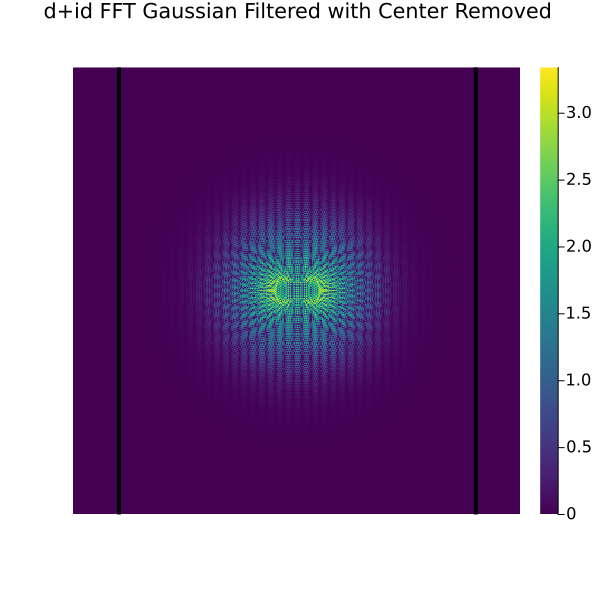

In [ ]:
# Assuming `ft_data_shifted` is the shifted Fourier-transformed data and `unique_x`, `unique_y` are grid axes
nx, ny = size(ft_data_shifted_total)
kx = -nx÷2:nx÷2-1
ky = -ny÷2:ny÷2-1

# Create a grid for Fourier space
kx_grid, ky_grid = [k for k in kx], [k for k in ky]
kx_matrix = repeat(kx_grid', ny, 1)
ky_matrix = repeat(ky_grid, 1, nx)

radius = 64.0  # Adjust the radius for the Gaussian mask
sigma = radius / 2.0  # Standard deviation of the Gaussian
gaussian_mask = exp.(-(kx_matrix.^2 .+ ky_matrix.^2) / (2 * sigma^2))


ft_data_shifted_filtered = ft_data_shifted_total .* gaussian_mask 

heatmap(
    unique_x, unique_y, log1p.(abs.(ft_data_shifted_filtered)),
    color=:viridis, aspect_ratio=:equal,
    xlabel="kx", ylabel="ky",
    title="d+id FFT Gaussian Filtered with Center Removed",
    framestyle=:none, size=(600, 600)
)
vline!([32], color=:black, linewidth=4, label="")
vline!([-32], color=:black, linewidth=4, label="")

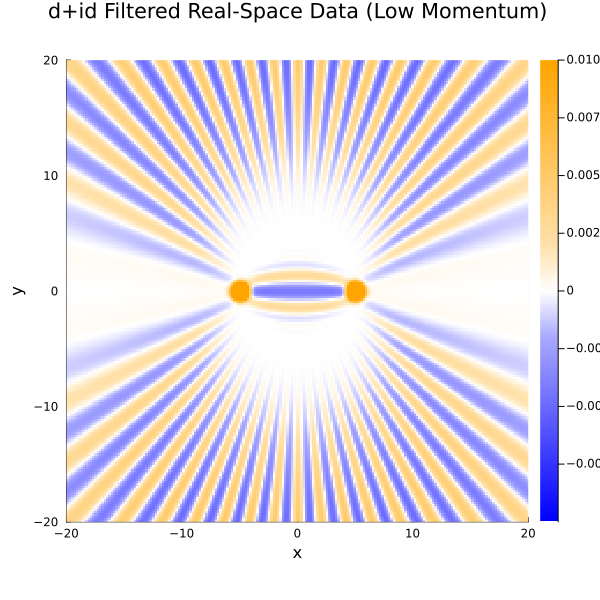

In [36]:
# Step 2: Map back to the unshifted Fourier space
ft_data_filtered = fftshift(ft_data_shifted_filtered)

# Step 3: Perform the Inverse Fourier Transform
filtered_data = ifft(ft_data_filtered)
filtered_data_real = real(filtered_data)

# writedlm("d+id_hyperbola_reconstructed.csv", filtered_data_real, ',')



# Step 4: Plot the filtered data in real space
heatmap(
    unique_x, unique_y, filtered_data_real,
    color=:viridis, aspect_ratio=:equal,
    xlabel="x", ylabel="y",
    title="d+id Filtered Real-Space Data (Low Momentum)"
)

# Custom colormap: Blue for negative, White for zero, Orange for positive
custom_cmap = cgrad([:blue, :white, :orange], [0.4, 0.6])  # Adjusting blend points

# Generate the heatmap
clim_max = 0.01

heatmap(
    unique_x, unique_y, filtered_data_real,
    color=custom_cmap, aspect_ratio=:equal,
    xlim=(-20, 20), ylim=(-20, 20),
    clims=(-clim_max, clim_max),  # Adjust limits for better contrast
    xlabel="x", ylabel="y",
    title="d+id Filtered Real-Space Data (Low Momentum)",
    size=(600, 600)
)